<a href="https://colab.research.google.com/github/MELCHIOR123-bot/Computer_Vision/blob/main/Digital_Image_Processing.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cv2

In [ ]:
# Uploading the image using CV
from google.colab.patches import cv2_imshow

img = cv2.imread('domore.jpeg')
cv2_imshow(img)

AttributeError: 'NoneType' object has no attribute 'clip'

In [ ]:
# Convert the image to grayscale using CV2
gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
cv2_imshow(gray_img)

In [ ]:
# Displyaing the grayscaled image image in terms of a matrix of pixels
print(gray_img)

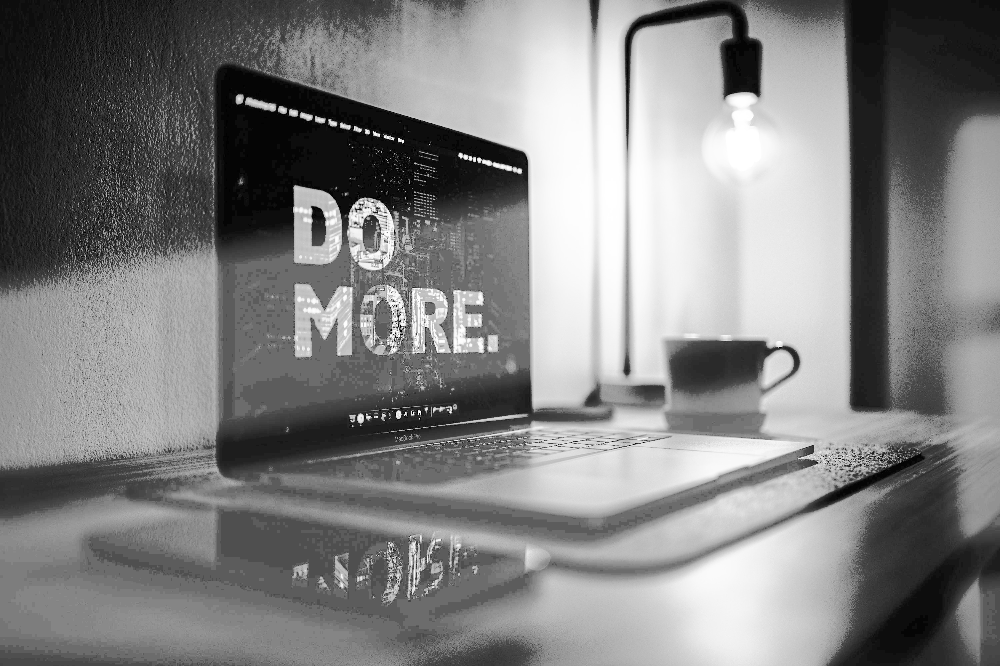

In [ ]:
# Apply histogram equalization
hist_eq_img = cv2.equalizeHist(gray_img)

cv2_imshow(hist_eq_img)

In [ ]:
# Adding 20 to each pixels
added_value_img = gray_img + 20
cv2_imshow(added_value_img)

In [ ]:
# Reflect the image along the x-axis (vertical flip)
x_axis_reflected_img = cv2.flip(img, 0)
cv2_imshow(x_axis_reflected_img)

In [ ]:
# Manually reflect the image along the x-axis by reversing rows
manual_x_axis_reflected_img = img[::-1, :, :]
cv2_imshow(manual_x_axis_reflected_img)

In [ ]:
# Displaying the images side by side
plt.figure(figsize=(12, 6))

plt.subplot(1, 4, 1)
plt.imshow(gray_img, cmap='gray')
plt.title('Original Grayscale Image')
plt.axis('off')

plt.subplot(1, 4, 2)
plt.imshow(added_value_img, cmap='gray')
plt.title('Grayscale Image + 20')
plt.axis('off')

plt.subplot(1,4,3)
plt.imshow(img)
plt.title('Original Image')
plt.axis('off')

plt.subplot(1,4,4)
plt.imshow(x_axis_reflected_img)
plt.title('X-Axis Reflected Image')
plt.axis('off')

plt.show()

In [ ]:
gamma = 0.5 # You can change this value

# Build a lookup table mapping the pixel values [0, 255] to their adjusted gamma values
inv_gamma = 1.0 / gamma
table = np.array([((i / 255.0) ** inv_gamma) * 255 for i in np.arange(0, 256)]).astype("uint8")

# Apply gamma correction using the lookup table
gamma_corrected_img = cv2.LUT(img, table)

cv2_imshow(gamma_corrected_img)

### Contrast Stretching

Contrast stretching (often called normalization) is a simple image enhancement technique that attempts to improve the contrast in an image by 'stretching' the range of intensity values it contains to span a desired range of values, e.g., the full range of pixel values (0-255). It is used to improve the visual appearance of an image or to make it more suitable for further processing.

In [ ]:
# Convert the image to grayscale for contrast stretching if it's not already
if len(img.shape) == 3:
    gray_for_contrast = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
else:
    gray_for_contrast = img

# Calculate min and max pixel values
min_val = np.min(gray_for_contrast)
max_val = np.max(gray_for_contrast)

# Apply contrast stretching
contrast_stretched_img = np.interp(gray_for_contrast, (min_val, max_val), (0, 255)).astype(np.uint8)

cv2_imshow(contrast_stretched_img)

### Negative Transformation

Negative transformation (or image inversion) is a simple image processing technique where each pixel's intensity value is subtracted from the maximum possible intensity value. For an 8-bit image, this means `Output_Pixel = 255 - Input_Pixel`. This operation produces a photographic negative of the original image, which can be useful for highlighting details in dark areas.

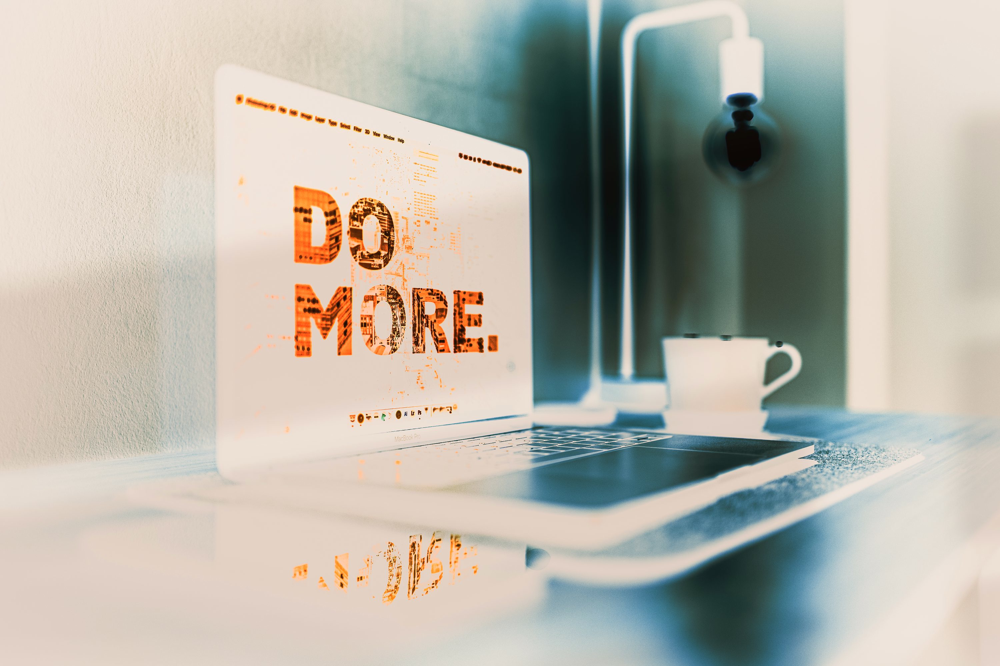

In [ ]:
# Apply negative transformation to the original image
negative_transformed_img = 255 - img

cv2_imshow(negative_transformed_img)

### Logarithmic Transformation

Logarithmic transformation is an image enhancement technique that compresses the dynamic range of an image. It maps a narrow range of dark input values to a wider range of output values, and a wider range of bright input values to a narrower range of output values. This transformation is particularly useful for brightening dark regions of an image while compressing the brighter regions, making details in dark areas more visible. The general formula for logarithmic transformation is `s = c * log(1 + r)`, where `r` is the input pixel intensity, `s` is the output pixel intensity, and `c` is a scaling constant.

/tmp/ipython-input-3698614341.py:6: RuntimeWarning: overflow encountered in scalar add
  c = 255 / np.log(1 + np.max(img))
/tmp/ipython-input-3698614341.py:6: RuntimeWarning: divide by zero encountered in log
  c = 255 / np.log(1 + np.max(img))


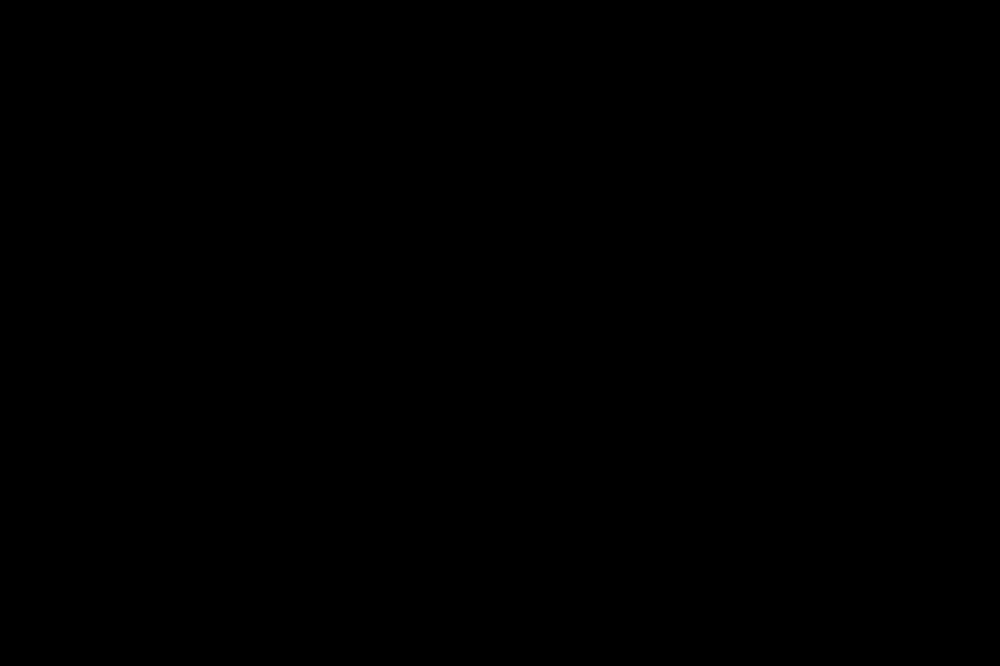

In [ ]:
# Apply log transformation to the image
# Ensure the image is converted to float for calculation and then back to uint8
# A common constant 'c' is 255 / log(1 + max_pixel_value), where max_pixel_value is 255 for 8-bit images.
# For visualization, it's often simpler to directly apply log and then scale.

c = 255 / np.log(1 + np.max(img))
log_transformed_img = c * np.log(1 + img.astype(np.float32))
log_transformed_img = np.array(log_transformed_img, dtype=np.uint8)

cv2_imshow(log_transformed_img)
